In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
from tqdm import tqdm
import cv2
import os
import seaborn as sns
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, Reshape, Input, Conv2DTranspose
from keras.layers import Activation, LeakyReLU, BatchNormalization, Dropout, Resizing
from keras.losses import BinaryCrossentropy
from tensorflow.keras.applications import VGG16

import warnings
warnings.filterwarnings('ignore')

try:
    from tensorflow.keras.optimizers import Adam
except:
    from keras.optimizers import Adam

In [2]:
NOISE_DIM = 100  
BATCH_SIZE = 4 
STEPS_PER_EPOCH = 3750
EPOCHS = 16
SEED = 40
WIDTH, HEIGHT, CHANNELS = 128, 128, 1

OPTIMIZER = Adam(0.0002, 0.5)

In [3]:
MAIN_DIR = "../input/brain-mri-images-for-brain-tumor-detection/yes"

In [4]:
def load_images(folder):
    
    imgs = []
    target = 1
    labels = []
    for i in os.listdir(folder):
        img_dir = os.path.join(folder,i)
        try:
            img = cv2.imread(img_dir)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, (128,128))
            imgs.append(img)
            labels.append(target)
        except:
            continue
        
    imgs = np.array(imgs)
    labels = np.array(labels)
    
    return imgs, labels

In [5]:
data, labels = load_images(MAIN_DIR)
data.shape, labels.shape

((155, 128, 128), (155,))

In [6]:
np.random.seed(SEED)
idxs = np.random.randint(0, 155, 124)

In [7]:
X_train = data[idxs]
X_train.shape

(20, 128, 128)

In [8]:
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

X_train = X_train.reshape(-1, WIDTH,HEIGHT,CHANNELS)

X_train.shape

(20, 128, 128, 1)

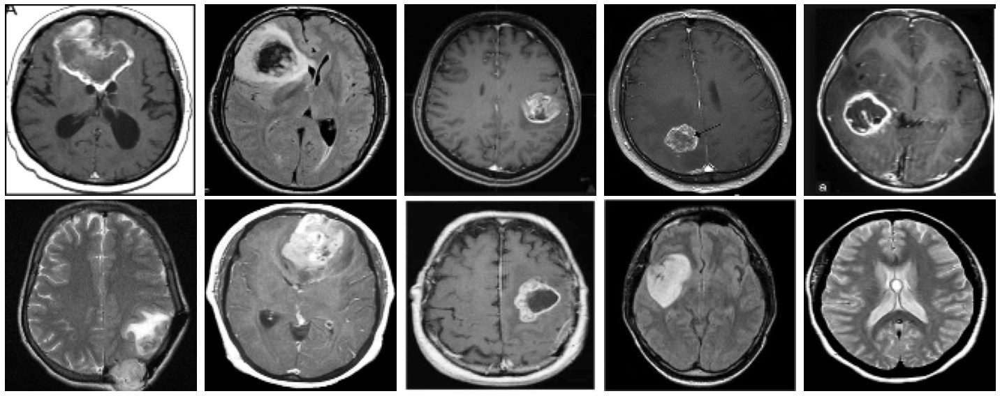

In [9]:
plt.figure(figsize=(20,8))
for i in range(10):
    axs = plt.subplot(2,5,i+1)
    plt.imshow(X_train[i], cmap="gray")
    plt.axis('off')
    axs.set_xticklabels([])
    axs.set_yticklabels([])
    plt.subplots_adjust(wspace=None, hspace=None)
plt.tight_layout()

In [10]:
def build_generator():

    model = Sequential([

        Dense(32*32*256, input_dim=NOISE_DIM),
        LeakyReLU(alpha=0.2),
        Reshape((32,32,256)),
        
        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2DTranspose(128, (4, 4), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh')
    ], 
    name="generator")
    model.summary()
    model.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

    return model


In [11]:
def build_discriminator():
    
    model = Sequential([

        Conv2D(64, (3, 3), padding='same', input_shape=(WIDTH, HEIGHT, CHANNELS)),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),

        Conv2D(128, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3, 3), strides=2, padding='same'),
        LeakyReLU(alpha=0.2),
        
        Flatten(),
        Dropout(0.4),
        Dense(1, activation="sigmoid", input_shape=(WIDTH, HEIGHT, CHANNELS))
    ], name="discriminator")
    model.summary()
    model.compile(loss="binary_crossentropy",
                        optimizer=OPTIMIZER)

    return model

In [12]:
print('\n')
discriminator = build_discriminator()
print('\n')
generator = build_generator()

discriminator.trainable = False 

gan_input = Input(shape=(NOISE_DIM,))
fake_image = generator(gan_input)

gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output, name="gan_model")
gan.compile(loss="binary_crossentropy", optimizer=OPTIMIZER)

print("The Combined Network:\n")
gan.summary()



Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 64)      640       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 256)   

In [15]:
from keras.utils.vis_utils import plot_model

def plot_model_architecture(model, to_file='model_plot.png'):
    plot_model(model, to_file=to_file, show_shapes=True, show_layer_names=True)

plot_model_architecture(gan, to_file='gan_simple.png')
plot_model_architecture(generator, to_file='gene_simple.png')
plot_model_architecture(discriminator, to_file='disc_simple.png')


In [16]:
def sample_images(noise, subplots, figsize=(22,8), save=False):
    generated_images = generator.predict(noise)
    plt.figure(figsize=figsize)
    
    for i, image in enumerate(generated_images):
        plt.subplot(subplots[0], subplots[1], i+1)
        if CHANNELS == 1:
            plt.imshow(image.reshape((WIDTH, HEIGHT)), cmap='gray')    
                                                                            
        else:
            plt.imshow(image.reshape((WIDTH, HEIGHT, CHANNELS)))
        if save == True:
            img_name = "gen" + str(i)
            plt.savefig(img_name)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

100%|██████████| 3750/3750 [05:18<00:00, 11.76it/s]


EPOCH: 1 Generator Loss: 3.9027 Discriminator Loss: 0.1637


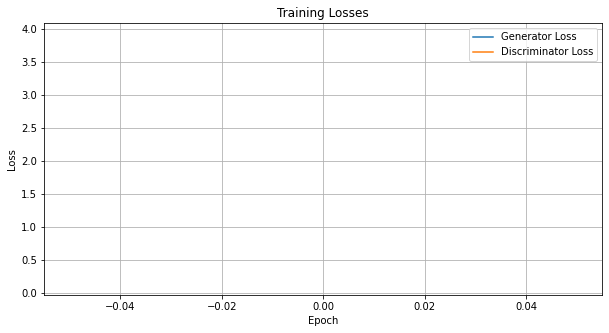

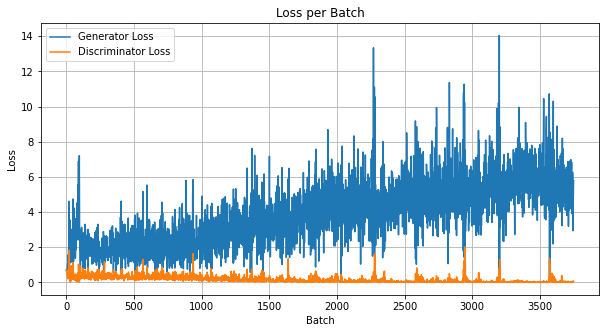

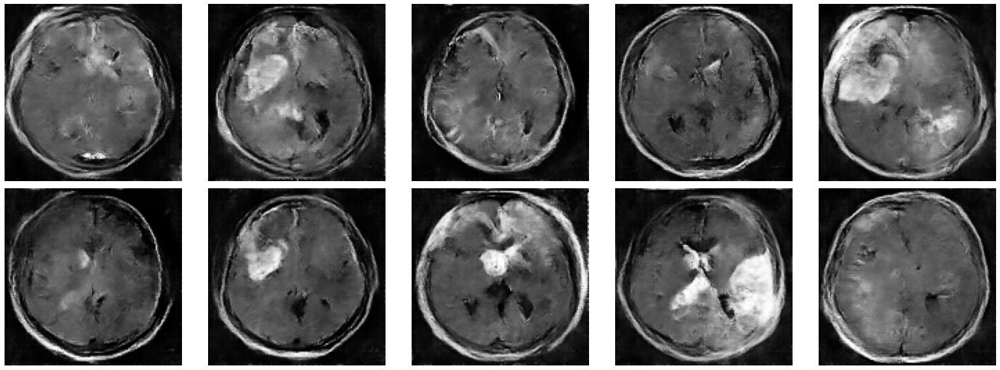

100%|██████████| 3750/3750 [05:11<00:00, 12.05it/s]


EPOCH: 2 Generator Loss: 6.7236 Discriminator Loss: 0.0484
Pesos guardados


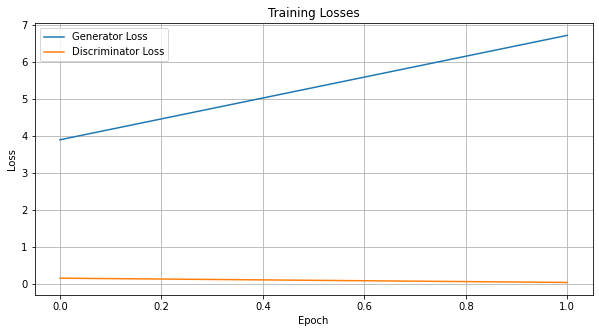

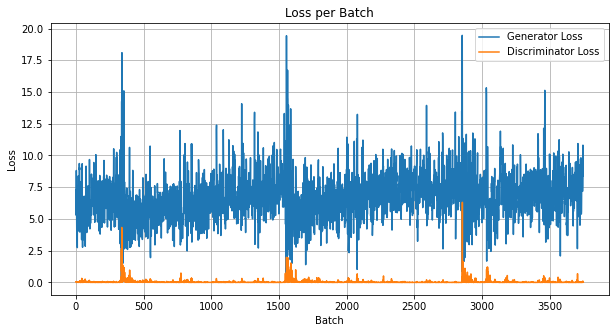

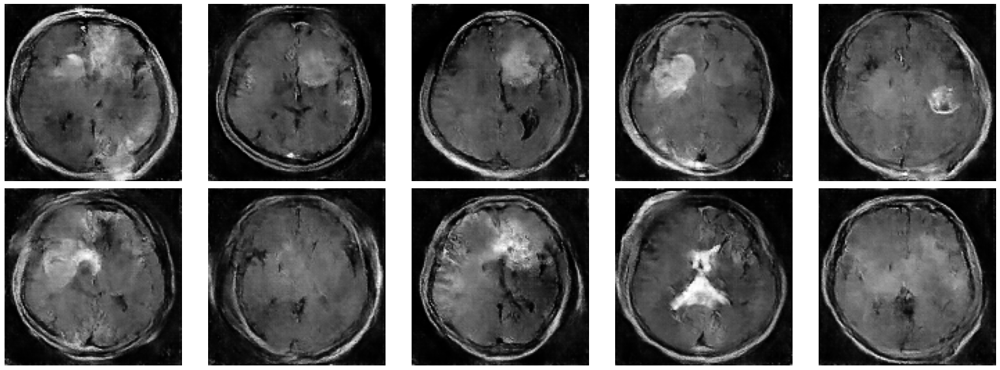

100%|██████████| 3750/3750 [05:14<00:00, 11.94it/s]


EPOCH: 3 Generator Loss: 7.7410 Discriminator Loss: 0.0415


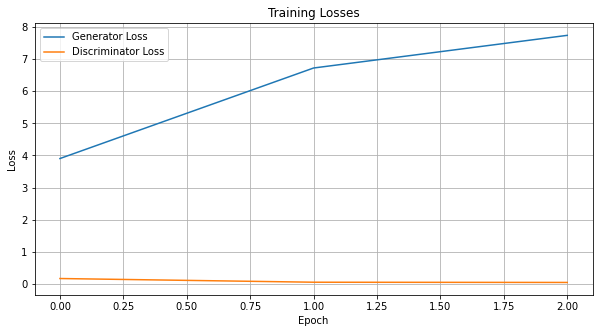

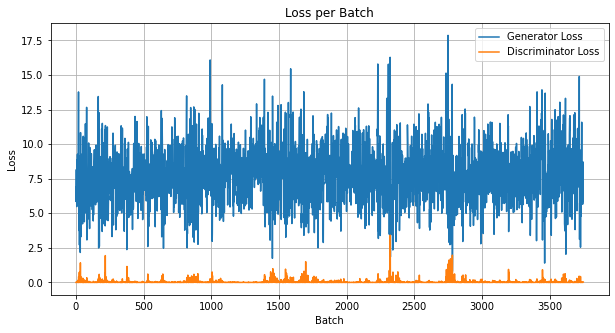

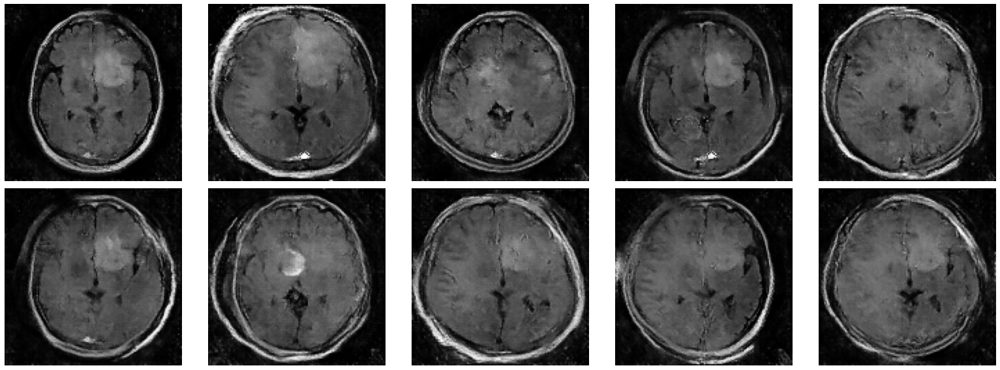

100%|██████████| 3750/3750 [05:12<00:00, 11.99it/s]


EPOCH: 4 Generator Loss: 7.6824 Discriminator Loss: 0.0604
Pesos guardados


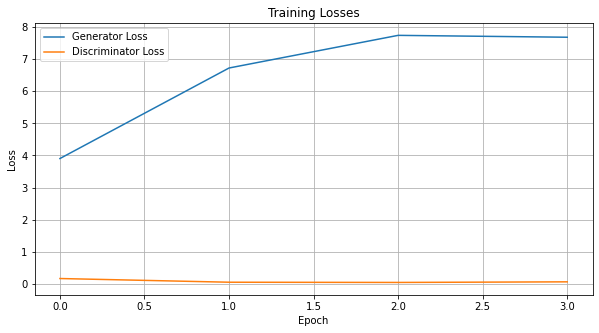

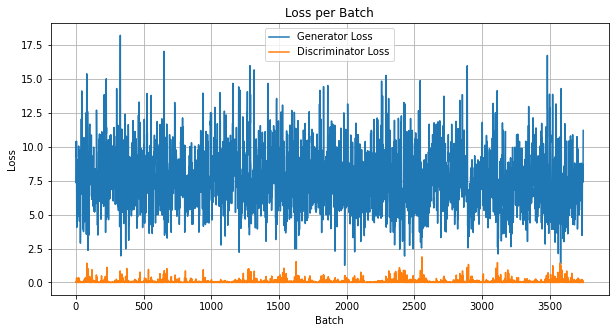

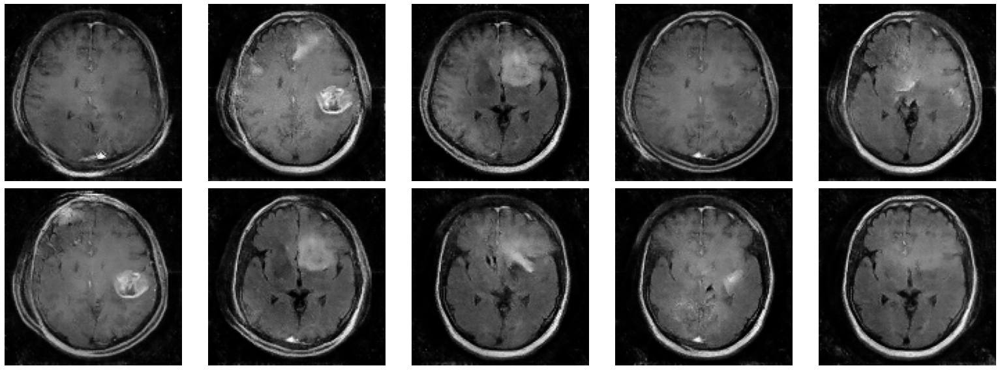

100%|██████████| 3750/3750 [05:12<00:00, 11.98it/s]


EPOCH: 5 Generator Loss: 6.8293 Discriminator Loss: 0.0753


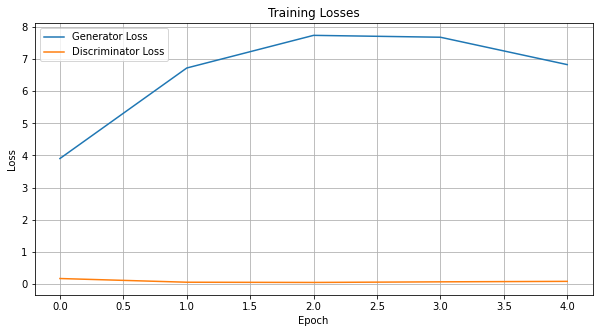

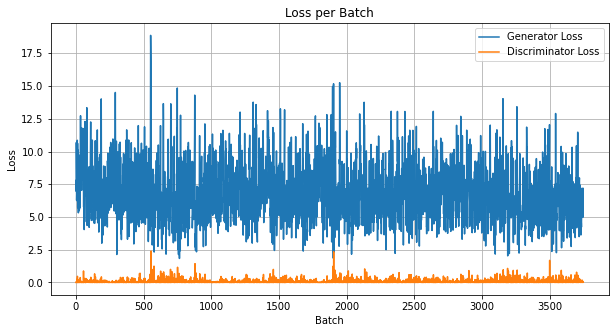

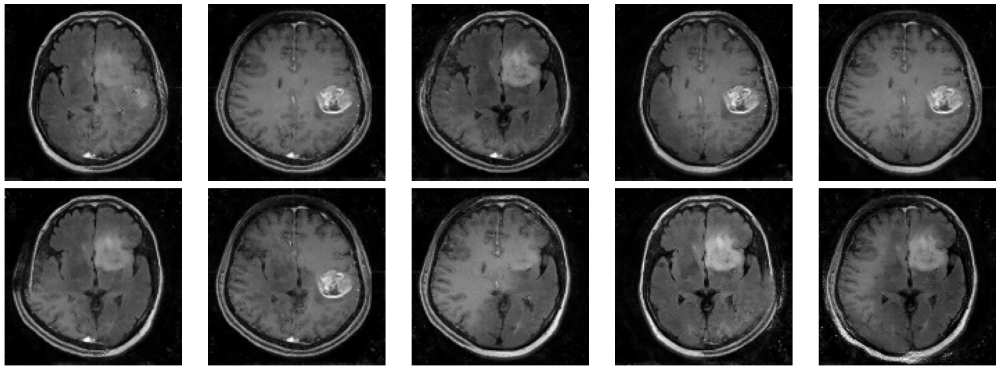

100%|██████████| 3750/3750 [05:13<00:00, 11.97it/s]


EPOCH: 6 Generator Loss: 5.6014 Discriminator Loss: 0.0984
Pesos guardados


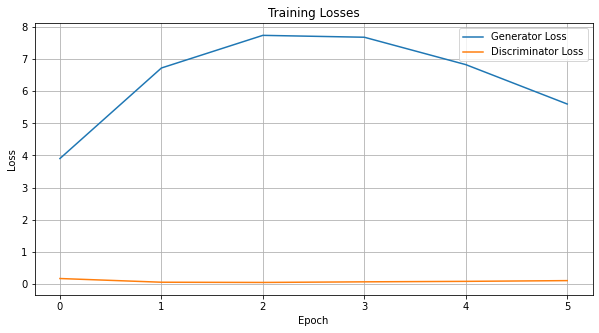

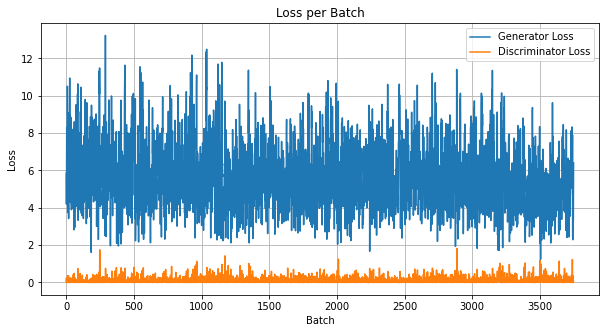

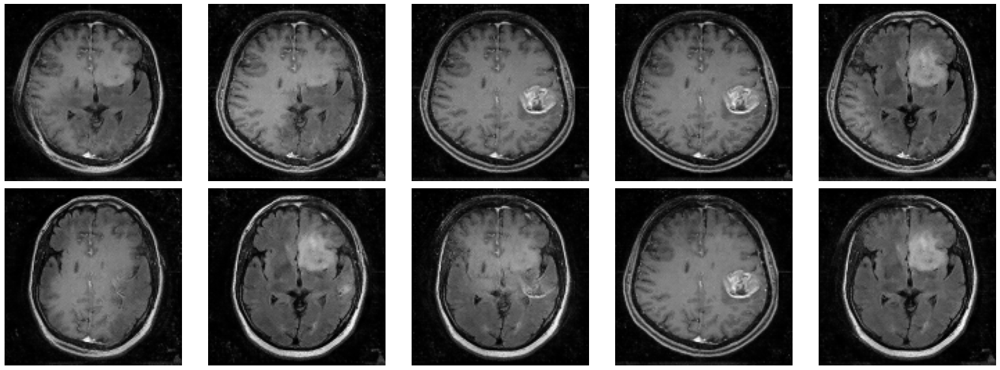

100%|██████████| 3750/3750 [05:12<00:00, 11.99it/s]


EPOCH: 7 Generator Loss: 5.0255 Discriminator Loss: 0.1064


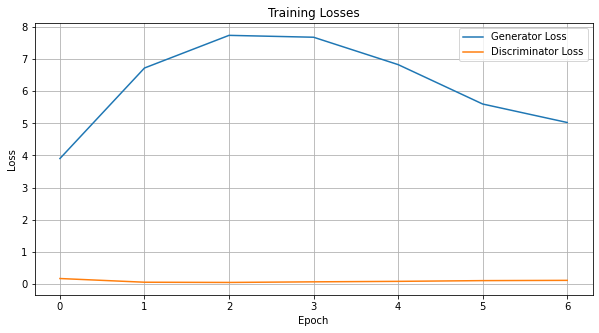

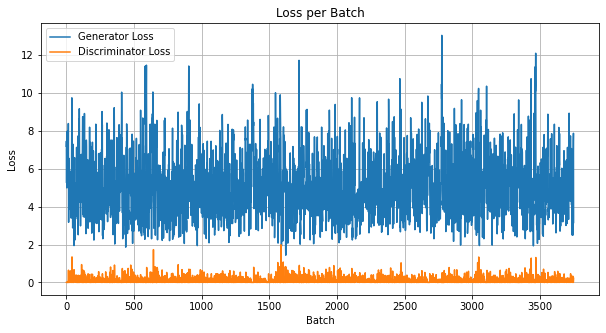

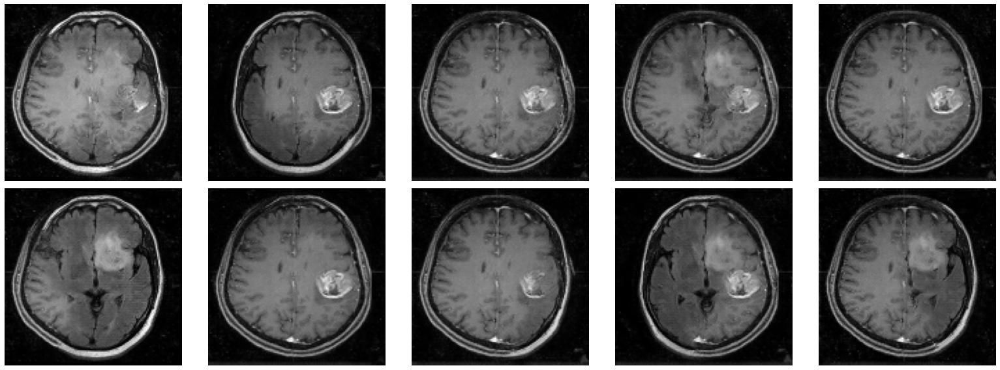

100%|██████████| 3750/3750 [05:13<00:00, 11.95it/s]


EPOCH: 8 Generator Loss: 4.8404 Discriminator Loss: 0.1124
Pesos guardados


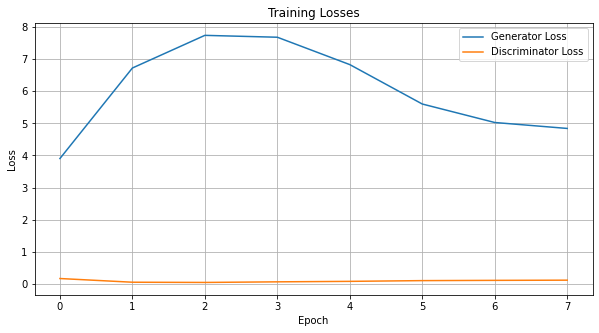

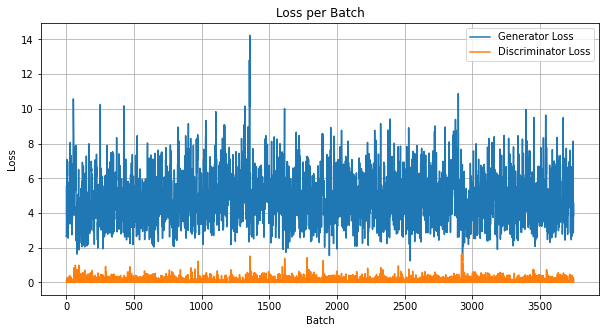

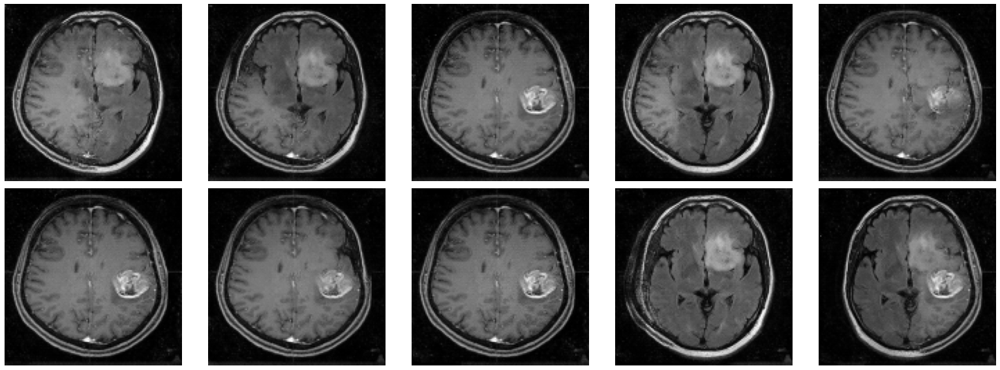

100%|██████████| 3750/3750 [05:13<00:00, 11.96it/s]


EPOCH: 9 Generator Loss: 4.8807 Discriminator Loss: 0.1073


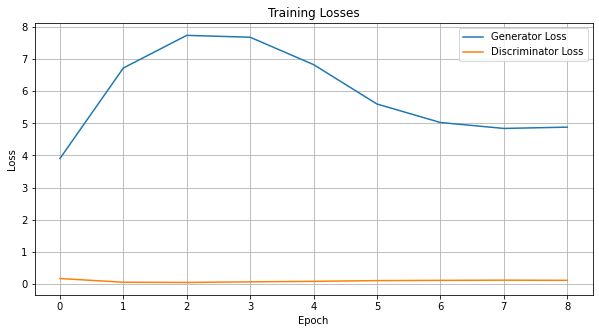

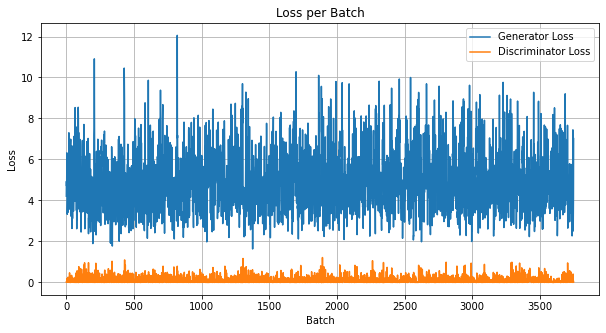

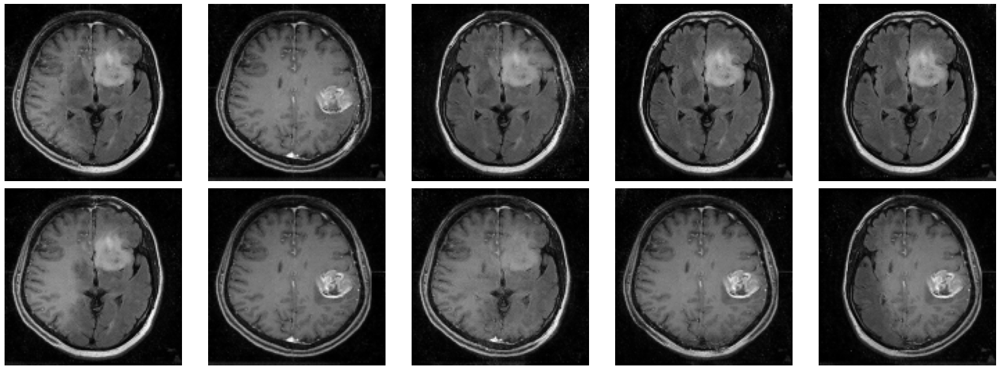

100%|██████████| 3750/3750 [05:14<00:00, 11.93it/s]


EPOCH: 10 Generator Loss: 5.2565 Discriminator Loss: 0.0913
Pesos guardados


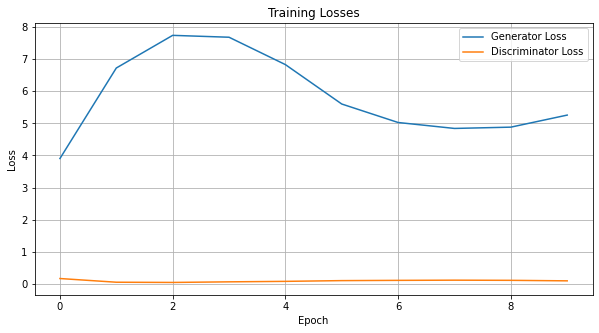

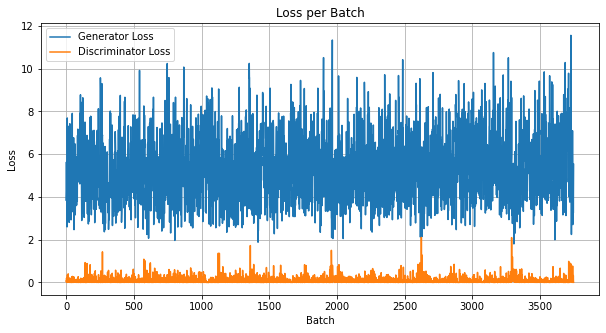

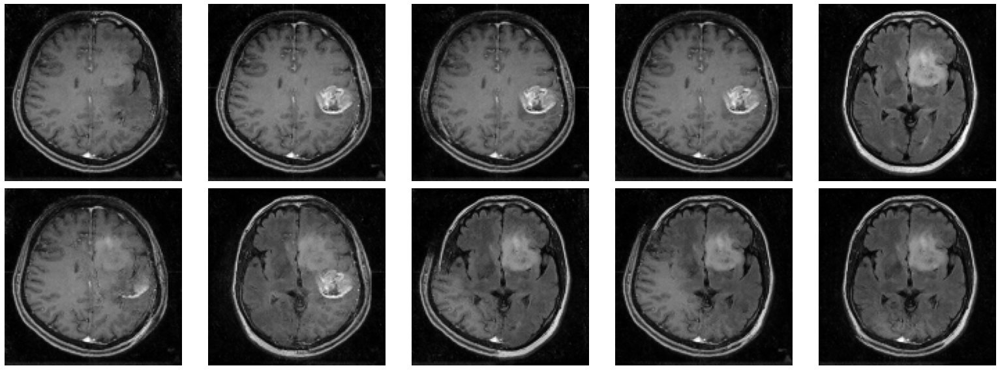

100%|██████████| 3750/3750 [05:14<00:00, 11.91it/s]


EPOCH: 11 Generator Loss: 5.7338 Discriminator Loss: 0.0810


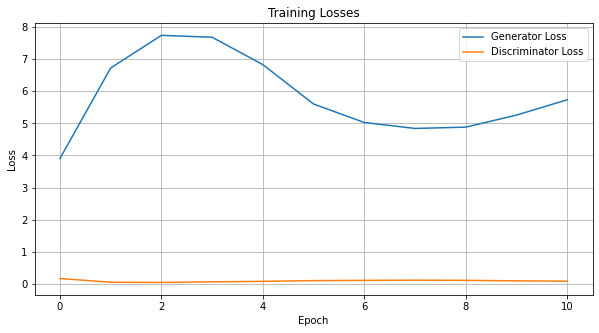

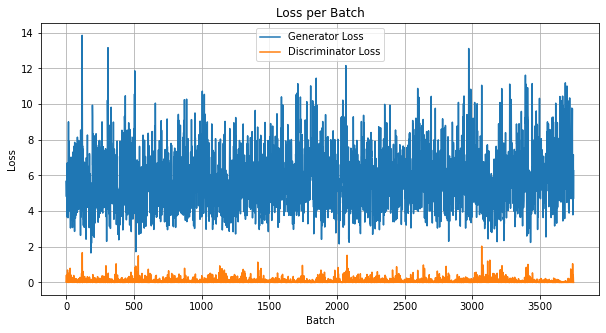

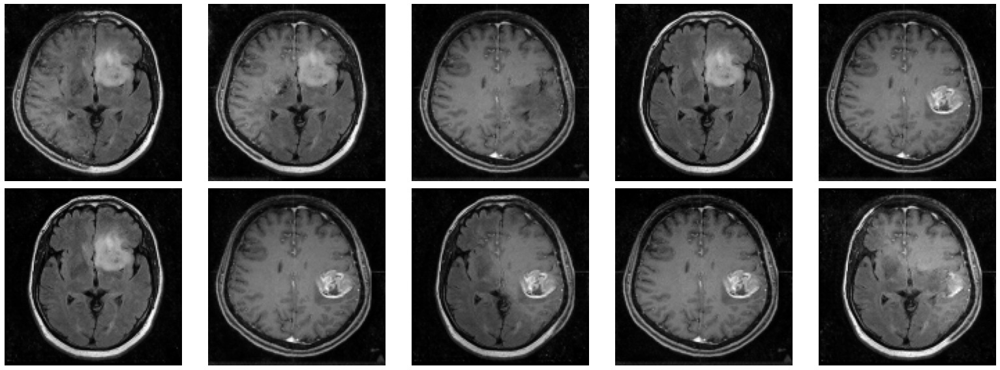

100%|██████████| 3750/3750 [05:16<00:00, 11.84it/s]


EPOCH: 12 Generator Loss: 6.3078 Discriminator Loss: 0.0739
Pesos guardados


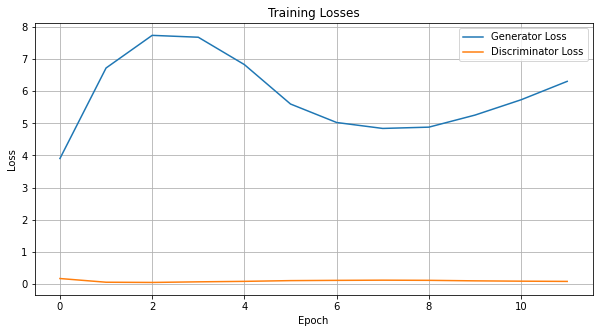

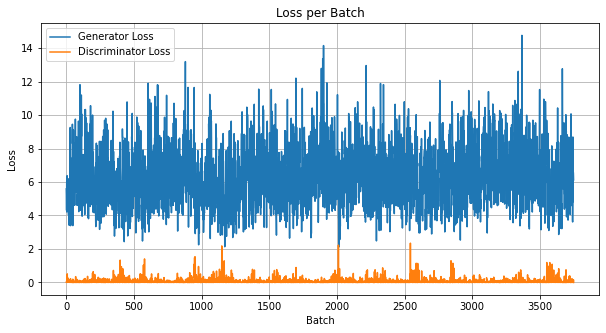

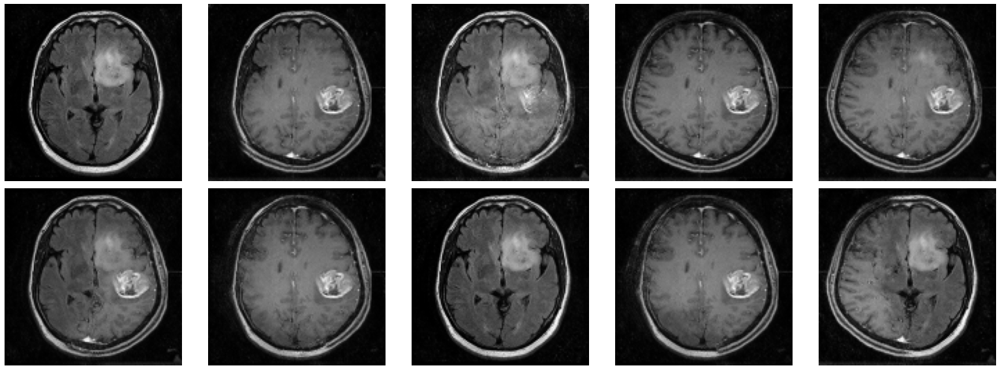

100%|██████████| 3750/3750 [05:15<00:00, 11.89it/s]


EPOCH: 13 Generator Loss: 6.8289 Discriminator Loss: 0.0692


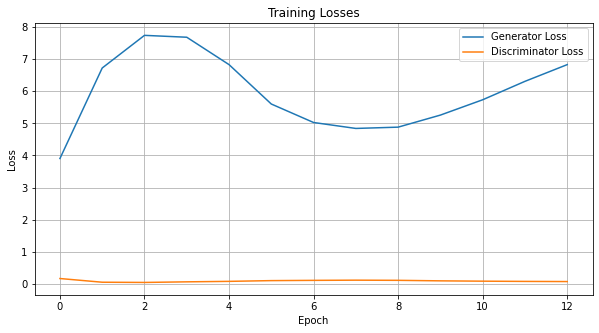

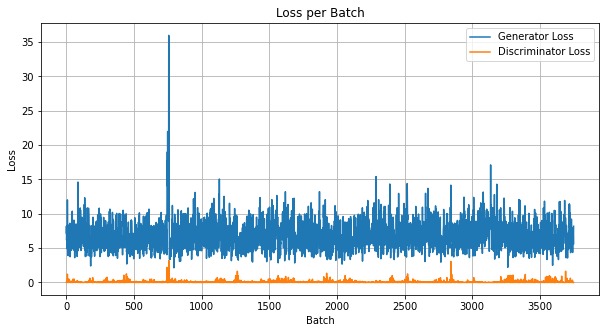

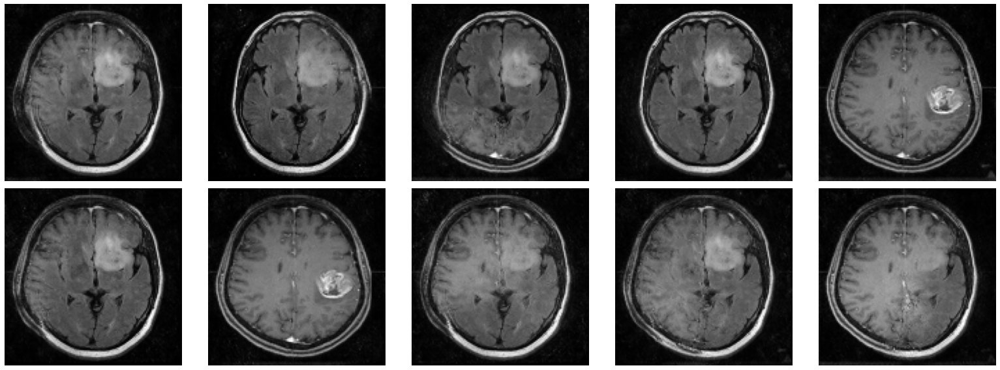

100%|██████████| 3750/3750 [05:16<00:00, 11.85it/s]


EPOCH: 14 Generator Loss: 6.8958 Discriminator Loss: 0.0692
Pesos guardados


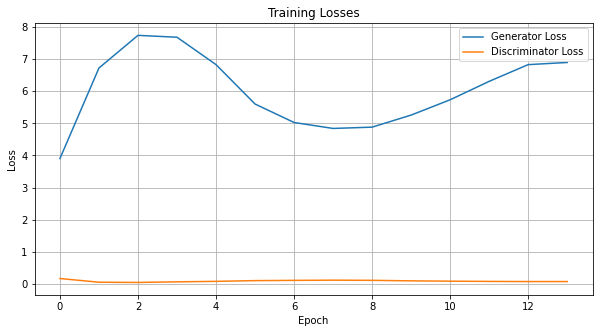

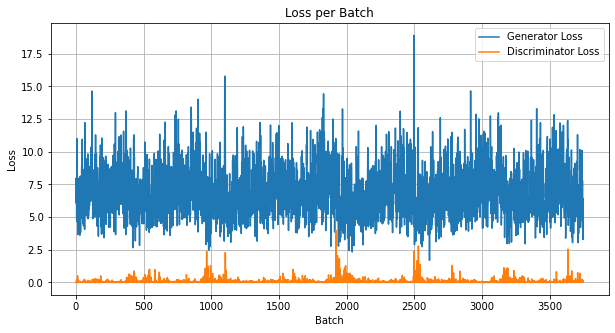

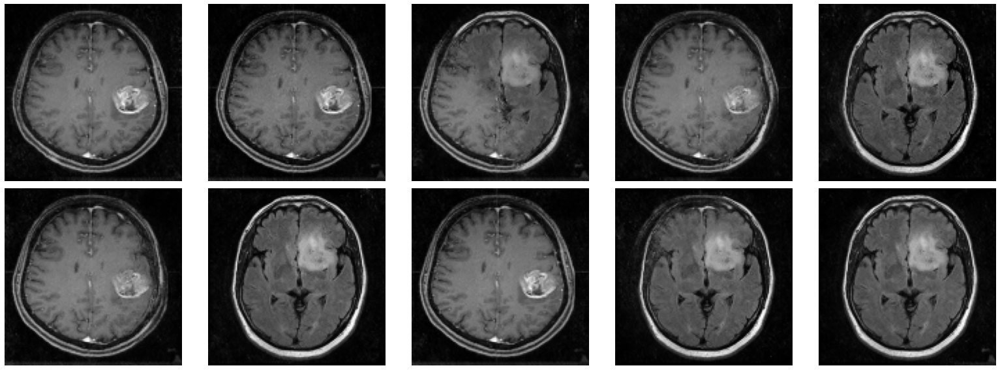

100%|██████████| 3750/3750 [05:16<00:00, 11.83it/s]


EPOCH: 15 Generator Loss: 7.1553 Discriminator Loss: 0.0670


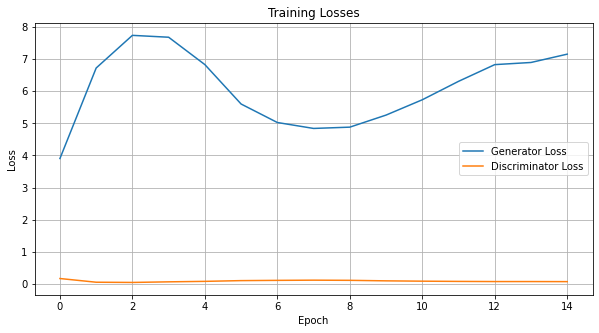

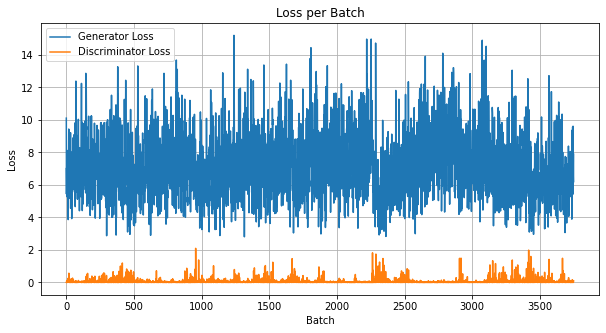

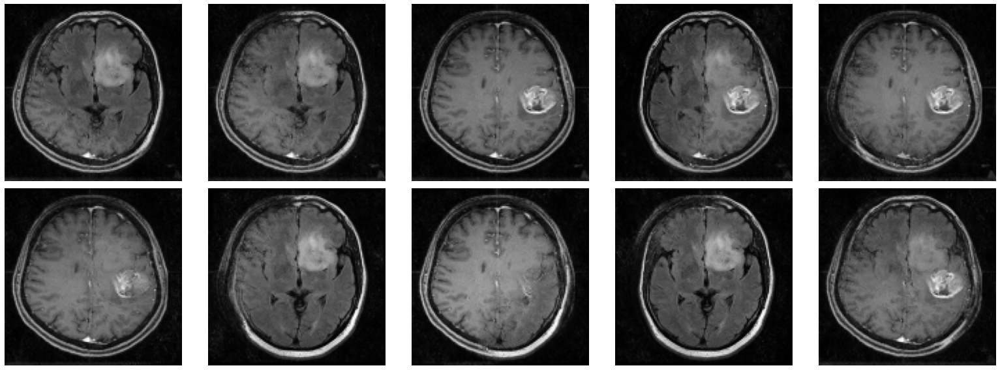

100%|██████████| 3750/3750 [05:17<00:00, 11.81it/s]


EPOCH: 16 Generator Loss: 7.4375 Discriminator Loss: 0.0631
Pesos guardados


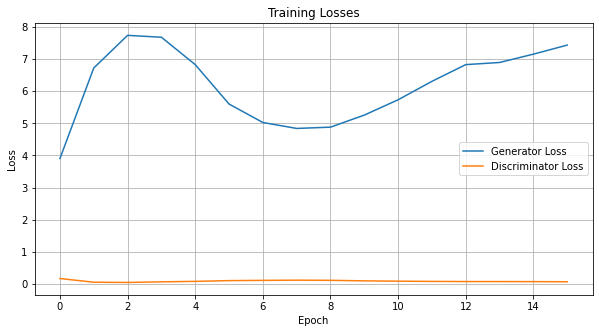

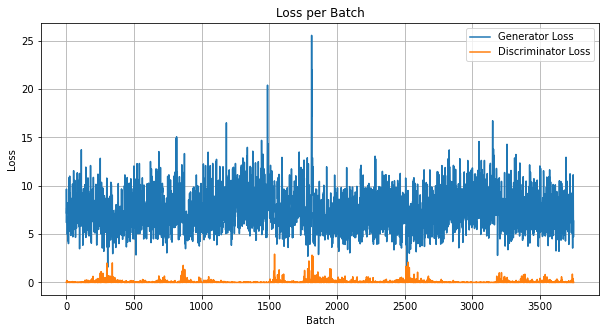

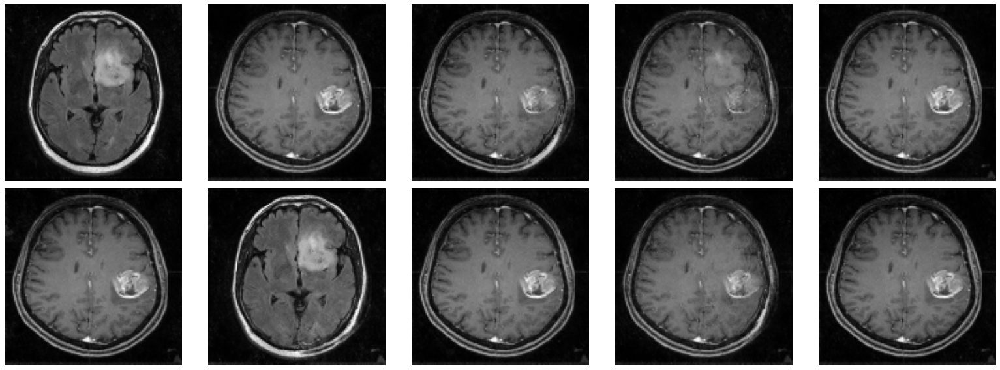

100%|██████████| 3750/3750 [05:06<00:00, 12.22it/s]


EPOCH: 17 Generator Loss: 7.5712 Discriminator Loss: 0.0650


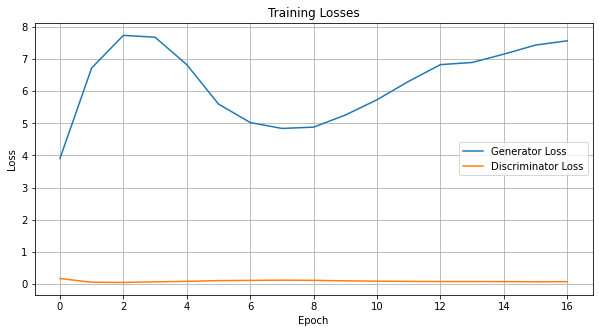

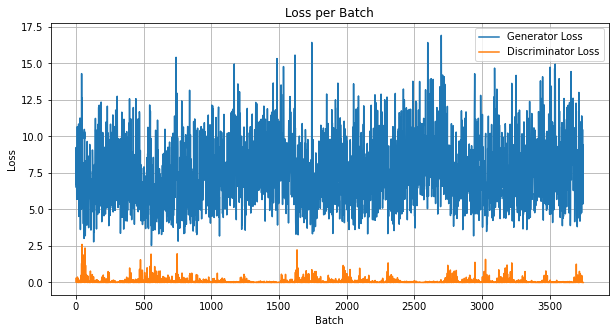

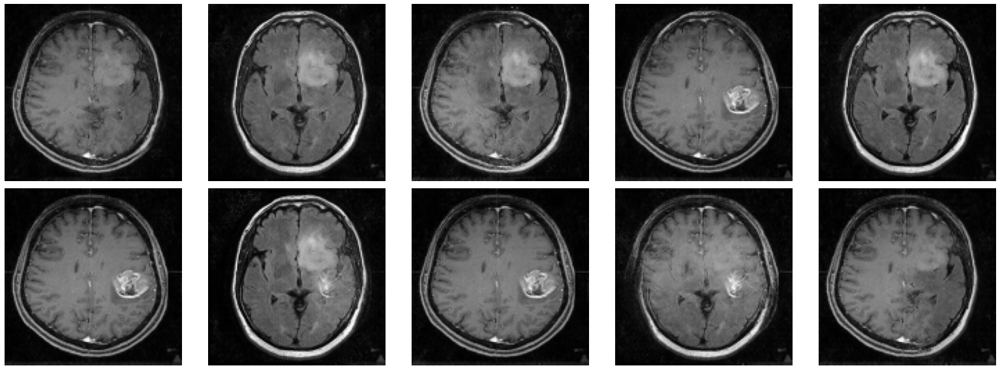

100%|██████████| 3750/3750 [05:11<00:00, 12.06it/s]


EPOCH: 18 Generator Loss: 7.7284 Discriminator Loss: 0.0667
Pesos guardados


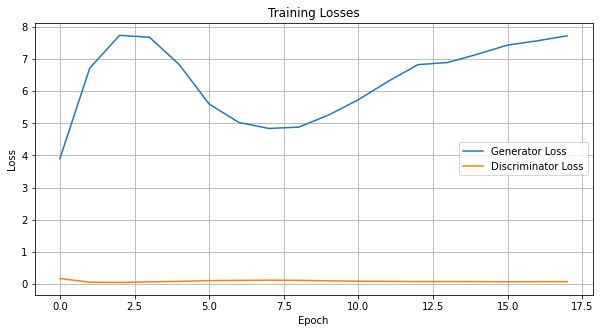

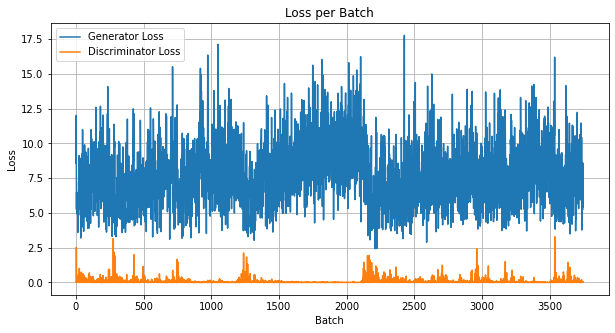

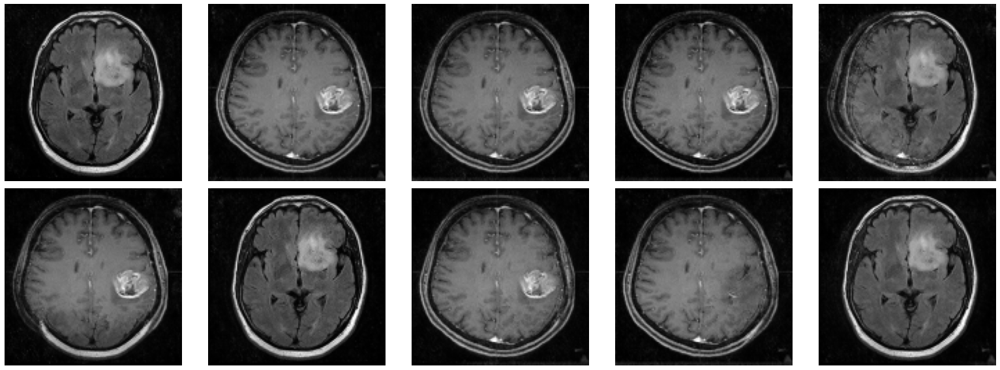

In [17]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

save_dir = '/kaggle/working/pesos_modelo_final_16_epocas/'

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

generator_losses = []
discriminator_losses = []

np.random.seed(SEED)
for epoch in range(18):
    epoch_generator_loss = 0
    epoch_discriminator_loss = 0
    losses_per_batch = []  
    
    for batch in tqdm(range(STEPS_PER_EPOCH)):

        noise = np.random.normal(0,1, size=(BATCH_SIZE, NOISE_DIM))
        fake_X = generator.predict(noise)
        
        idx = np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)
        real_X = X_train[idx]

        X = np.concatenate((real_X, fake_X))

        disc_y = np.zeros(2*BATCH_SIZE)
        disc_y[:BATCH_SIZE] = 1

        d_loss = discriminator.train_on_batch(X, disc_y)
        
        y_gen = np.ones(BATCH_SIZE)
        g_loss = gan.train_on_batch(noise, y_gen)
        
        epoch_generator_loss += g_loss
        epoch_discriminator_loss += d_loss
        losses_per_batch.append((g_loss, d_loss))  

   
    epoch_generator_loss /= STEPS_PER_EPOCH
    epoch_discriminator_loss /= STEPS_PER_EPOCH
    
    generator_losses.append(epoch_generator_loss)
    discriminator_losses.append(epoch_discriminator_loss)

    print(f"EPOCH: {epoch + 1} Generator Loss: {epoch_generator_loss:.4f} Discriminator Loss: {epoch_discriminator_loss:.4f}")
    
    if (epoch + 1) % 2 == 0:
        print('Pesos guardados')
        generator.save_weights(os.path.join(save_dir, f"generator_weights_epoch_{epoch+1}.h5"))
        discriminator.save_weights(os.path.join(save_dir, f"discriminator_weights_epoch_{epoch+1}.h5"))
    
    plt.figure(figsize=(10, 5))
    plt.plot(generator_losses, label="Generator Loss")
    plt.plot(discriminator_losses, label="Discriminator Loss")
    plt.title("Training Losses")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    losses_per_batch = np.array(losses_per_batch)
    plt.figure(figsize=(10, 5))
    plt.plot(losses_per_batch[:, 0], label="Generator Loss")
    plt.plot(losses_per_batch[:, 1], label="Discriminator Loss")
    plt.title("Loss per Batch")
    plt.xlabel("Batch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    noise = np.random.normal(0, 1, size=(10, NOISE_DIM))
    sample_images(noise, (2, 5))

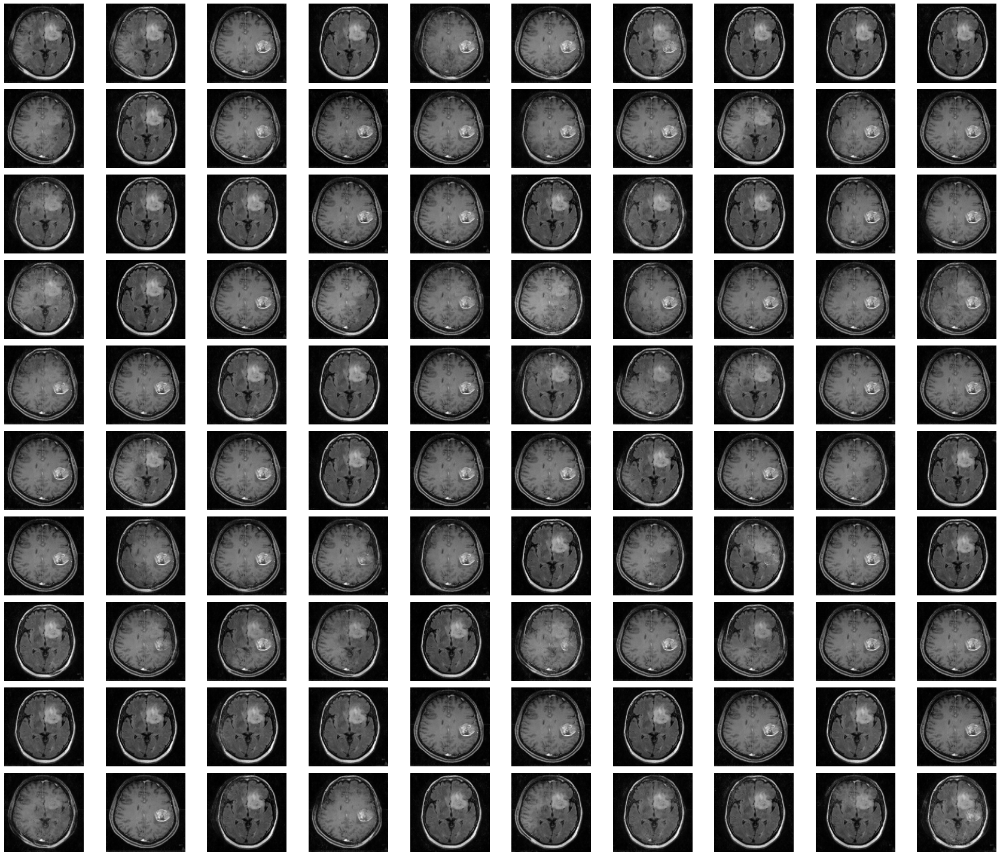

In [18]:
noise = np.random.normal(0, 1, size=(100, NOISE_DIM))
sample_images(noise, (10,10), (24,20), save=True)

In [19]:
generated_images = generator.predict(noise)
generated_images.shape

(100, 128, 128, 1)

In [ ]:
X_train.shape

In [ ]:
fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(18,10))

sns.distplot(X_train, label='Real Images', hist=True, color='#fc0328', ax=axs)
sns.distplot(generated_images, label='Generated Images', hist=True, color='#0c06c7', ax=axs)

axs.legend(loc='upper right', prop={'size': 12})

plt.show()